In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
import random as rn
import tensorflow as tf

In [3]:
df = pd.read_csv('../Tetrahymena_Data/Tetrahymena_SJB_90', index_col='Unnamed: 0')

In [4]:
df.head()

,Dependent,nAcid,nN,nS,nX,ATS0m,ATS2m,ATS3m,ATS4m,ATS5m,...,VR2_D,VR3_D,TopoPSA,MW,AMW,WTPT-3,WTPT-4,WPATH,WPOL,XLogP
0,-0.16,0,0,0,4,5171.074121,7540.215000,0.000000,0.000000,0.0,...,800000.000000,7.600902,0.00,151.875411,30.375082,9.000000,0.000000,16,0,2.864
1,1.64,0,1,0,1,7239.077516,1949.851947,2621.276160,0.000000,0.0,...,2.475191,1.257878,43.14,138.926890,19.846699,9.806844,4.626105,18,2,0.927
2,-2.72,0,0,0,0,404.296378,63.536256,3.048192,0.000000,0.0,...,0.707107,0.069315,20.23,32.026215,5.337702,2.000000,2.000000,1,0,-0.499
3,-0.87,0,2,0,0,796.688476,478.062438,281.606409,34.286112,0.0,...,2.113087,0.853778,55.12,60.032363,7.504045,7.181981,2.310660,10,1,-1.524
4,-1.32,0,2,1,0,1568.564075,1144.785369,185.742144,4.064256,0.0,...,750000.000000,5.965649,84.13,76.009519,9.501190,6.732051,0.000000,9,0,-0.801


In [5]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [6]:
scaler = StandardScaler()

In [7]:
scaler.fit(df.drop('Dependent', axis=1))

StandardScaler(copy=True, with_mean=True, with_std=True)

In [8]:
scaled_feats = scaler.transform(df.drop('Dependent', axis=1))

In [9]:
df_feats = pd.DataFrame(scaled_feats, columns=df.columns[1:])

In [10]:
X = df_feats
y = df['Dependent']

In [11]:
input_shape = X.shape[1]

In [12]:
kf = KFold(n_splits=10, shuffle=True, random_state=101)

# Default NN Parameters

In [13]:
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

In [16]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    min_delta=0.001,
    patience=25,
    mode='min',
    restore_best_weights=True
)

In [ ]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_model, mae_model, mse_model, train_r2_model = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('NN Default Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))

    model.add(Dense(units=1))

    model.compile(optimizer='adam', loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=128,
         verbose=0,
         epochs=100)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_model.append(r2_score(y_test, model.predict(X_test)))
    mae_model.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_model.append(r2_score(y_train, model.predict(X_train)))
    
r2_default = np.mean(r2_model)
mae_default = np.mean(mae_model)
mse_default = np.mean(mse_model)
rmse_default = np.sqrt(mse_default)
train_r2_default = np.mean(train_r2_model)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Default_Parameters.png', bbox_inches='tight')

print('Default Parameters', '\n')
print('KFold R2: ', r2_default)
print('KFold MAE: ', mae_default)
print('KFold MSE: ', mse_default)
print('KFold RMSE: ', rmse_default)

In [146]:
print(train_r2_default)

0.9530088105409813


# Manual Parameter Tuning
## Number of Nodes

In [86]:
test_r2_1lnn, mse_1lnn, train_r2_1lnn = list(), list(), list()
n_nodes = list(range(50, 1050, 50))

for num_nodes in n_nodes:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_1lnn.append(np.mean(train_r2_model))
    test_r2_1lnn.append(np.mean(test_r2_model))
    mse_1lnn.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_1lnn))
print('Optimal R2 Train: ', train_r2_1lnn[test_r2_1lnn.index(max(test_r2_1lnn))])
print('MSE: ', mse_1lnn[test_r2_1lnn.index(max(test_r2_1lnn))])
print('n_nodes: ', n_nodes[test_r2_1lnn.index(max(test_r2_1lnn))])

Default R2:  0.7918829288475372
Optimal R2 0.7931579811073429
Optimal R2 Train:  0.9528517558968088
MSE:  0.22340965654768946
n_nodes:  400


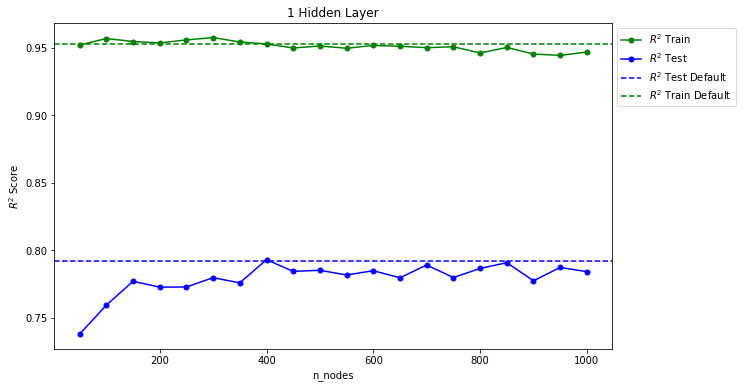

In [87]:
plt.figure(figsize=(10,6))
plt.plot(n_nodes, train_r2_1lnn, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_nodes, test_r2_1lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('1 Hidden Layer')
plt.xlabel('n_nodes')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_1HL_Nodes_R2.png', bbox_inches='tight')

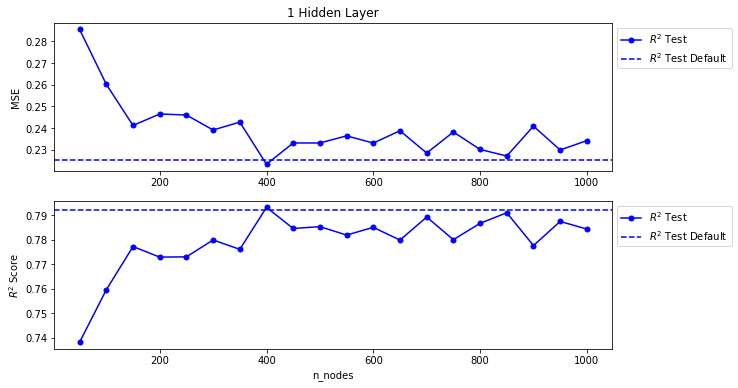

In [88]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_nodes, test_r2_1lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('n_nodes')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('1 Hidden Layer')
ax1.plot(n_nodes, mse_1lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_1HL_Nodes_MSE_R2.png', bbox_inches='tight')

In [89]:
test_r2_2lnn, mse_2lnn, train_r2_2lnn = list(), list(), list()
n_nodes = list(range(50, 1050, 50))

for num_nodes in n_nodes:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))
        
        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_2lnn.append(np.mean(train_r2_model))
    test_r2_2lnn.append(np.mean(test_r2_model))
    mse_2lnn.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_2lnn))
print('Optimal R2 Train: ', train_r2_2lnn[test_r2_2lnn.index(max(test_r2_2lnn))])
print('MSE: ', mse_2lnn[test_r2_2lnn.index(max(test_r2_2lnn))])
print('n_nodes: ', n_nodes[test_r2_2lnn.index(max(test_r2_2lnn))])

Default R2:  0.7918829288475372
Optimal R2 0.8058302813120598
Optimal R2 Train:  0.9661875712470328
MSE:  0.2101678107726536
n_nodes:  750


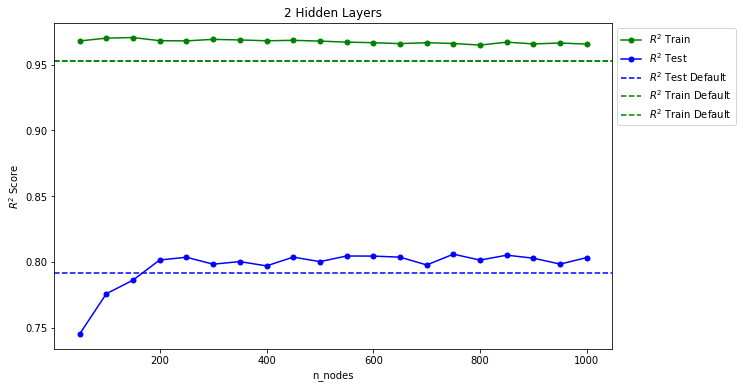

In [90]:
plt.figure(figsize=(10,6))
plt.plot(n_nodes, train_r2_2lnn, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_nodes, test_r2_2lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('2 Hidden Layers')
plt.xlabel('n_nodes')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_2HL_Nodes_R2.png', bbox_inches='tight')

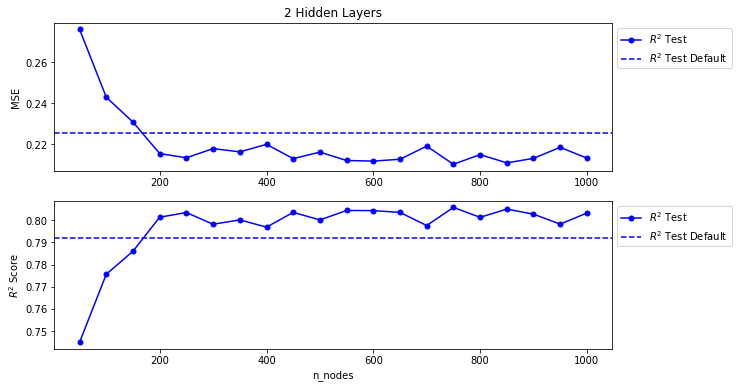

In [91]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_nodes, test_r2_2lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('n_nodes')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('2 Hidden Layers')
ax1.plot(n_nodes, mse_2lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_2HL_Nodes_MSE_R2.png', bbox_inches='tight')

In [92]:
test_r2_3lnn, mse_3lnn, train_r2_3lnn = list(), list(), list()
n_nodes = list(range(50, 1050, 50))

for num_nodes in n_nodes:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))
        
        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))
        
        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_3lnn.append(np.mean(train_r2_model))
    test_r2_3lnn.append(np.mean(test_r2_model))
    mse_3lnn.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_3lnn))
print('Optimal R2 Train: ', train_r2_3lnn[test_r2_3lnn.index(max(test_r2_3lnn))])
print('MSE: ', mse_3lnn[test_r2_3lnn.index(max(test_r2_3lnn))])
print('n_nodes: ', n_nodes[test_r2_3lnn.index(max(test_r2_3lnn))])

Default R2:  0.7918829288475372
Optimal R2 0.8066391260046742
Optimal R2 Train:  0.9724403305833829
MSE:  0.20868884480303262
n_nodes:  450


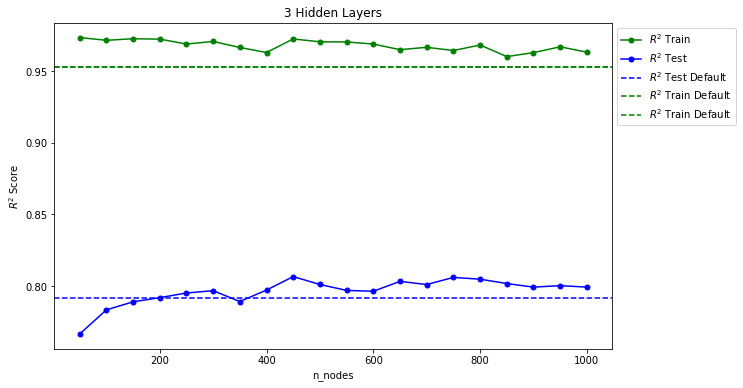

In [93]:
plt.figure(figsize=(10,6))
plt.plot(n_nodes, train_r2_3lnn, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_nodes, test_r2_3lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('3 Hidden Layers')
plt.xlabel('n_nodes')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_3HL_Nodes_R2.png', bbox_inches='tight')

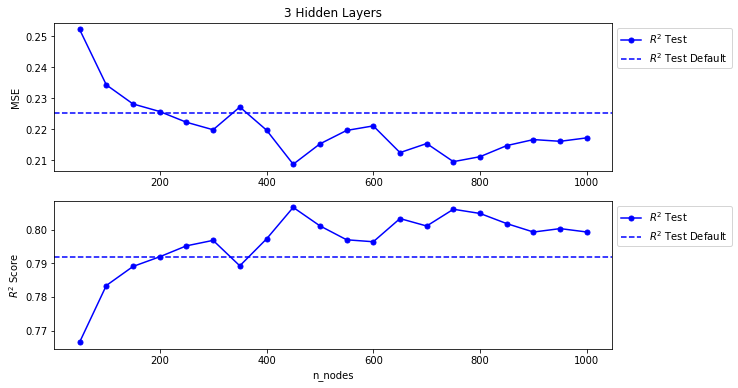

In [94]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_nodes, test_r2_3lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('n_nodes')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('3 Hidden Layers')
ax1.plot(n_nodes, mse_3lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_3HL_Nodes_MSE_R2.png', bbox_inches='tight')

In [95]:
test_r2_4lnn, mse_4lnn, train_r2_4lnn = list(), list(), list()
n_nodes = list(range(50, 1050, 50))

for num_nodes in n_nodes:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))
        
        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))
        
        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=num_nodes, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_4lnn.append(np.mean(train_r2_model))
    test_r2_4lnn.append(np.mean(test_r2_model))
    mse_4lnn.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_4lnn))
print('Optimal R2 Train: ', train_r2_4lnn[test_r2_4lnn.index(max(test_r2_4lnn))])
print('MSE: ', mse_4lnn[test_r2_4lnn.index(max(test_r2_4lnn))])
print('n_nodes: ', n_nodes[test_r2_4lnn.index(max(test_r2_4lnn))])

Default R2:  0.7918829288475372
Optimal R2 0.8125052159212507
Optimal R2 Train:  0.9700356941785943
MSE:  0.20303563225043955
n_nodes:  750


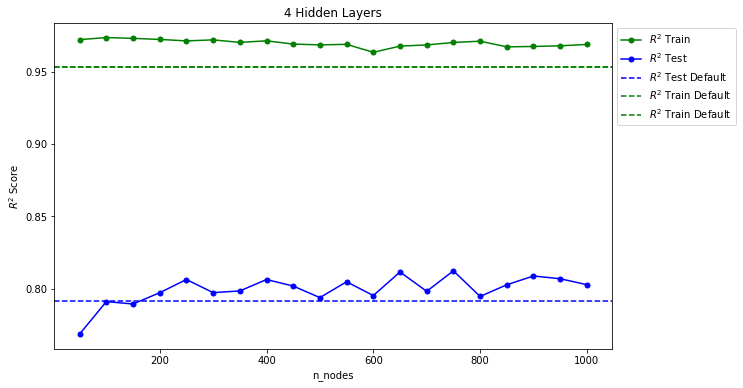

In [96]:
plt.figure(figsize=(10,6))
plt.plot(n_nodes, train_r2_4lnn, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_nodes, test_r2_4lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('4 Hidden Layers')
plt.xlabel('n_nodes')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_4HL_Nodes_R2.png', bbox_inches='tight')

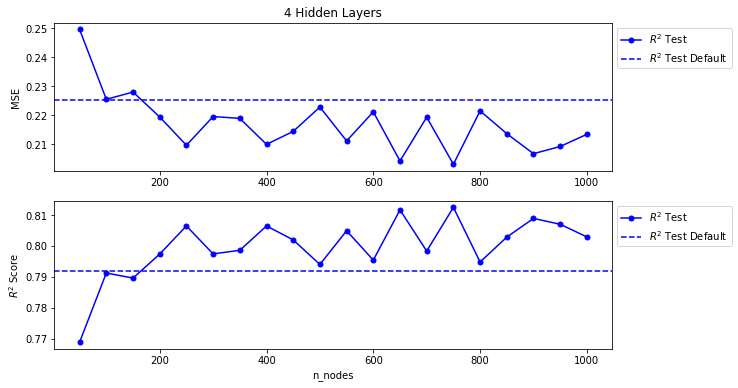

In [97]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_nodes, test_r2_4lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('n_nodes')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('4 Hidden Layers')
ax1.plot(n_nodes, mse_4lnn, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_4HL_Nodes_MSE_R2.png', bbox_inches='tight')

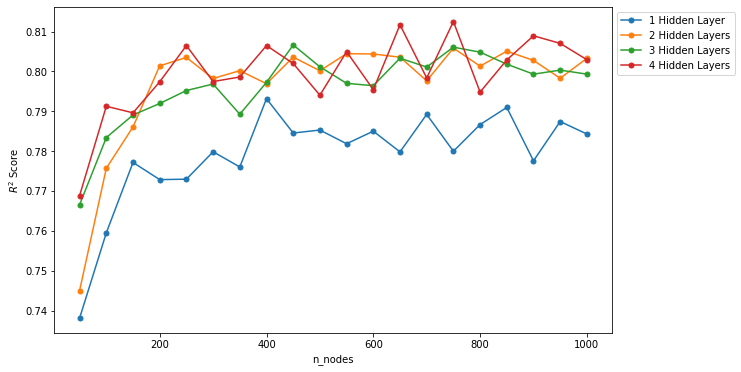

In [98]:
plt.figure(figsize=(10,6))
plt.plot(n_nodes, test_r2_1lnn, linestyle='-', marker='o', markersize=5,label='1 Hidden Layer')
plt.plot(n_nodes, test_r2_2lnn, linestyle='-', marker='o', markersize=5,label='2 Hidden Layers')
plt.plot(n_nodes, test_r2_3lnn, linestyle='-', marker='o', markersize=5,label='3 Hidden Layers')
plt.plot(n_nodes, test_r2_4lnn, linestyle='-', marker='o', markersize=5,label='4 Hidden Layers')
plt.xlabel('n_nodes')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_HL_Nodes_MSE_R2.png', bbox_inches='tight')

## Dropout

In [99]:
test_r2_1ldo, mse_1ldo, train_r2_1ldo = list(), list(), list()
dropout_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5]

for dropout in dropout_list:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_1ldo.append(np.mean(train_r2_model))
    test_r2_1ldo.append(np.mean(test_r2_model))
    mse_1ldo.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_1ldo))
print('Optimal R2 Train: ', train_r2_1ldo[test_r2_1ldo.index(max(test_r2_1ldo))])
print('MSE: ', mse_1ldo[test_r2_1ldo.index(max(test_r2_1ldo))])
print('dropout: ', dropout_list[test_r2_1ldo.index(max(test_r2_1ldo))])

Default R2:  0.7918829288475372
Optimal R2 0.7923860031215373
Optimal R2 Train:  0.9407580205898096
MSE:  0.22596239173620702
dropout:  0.1


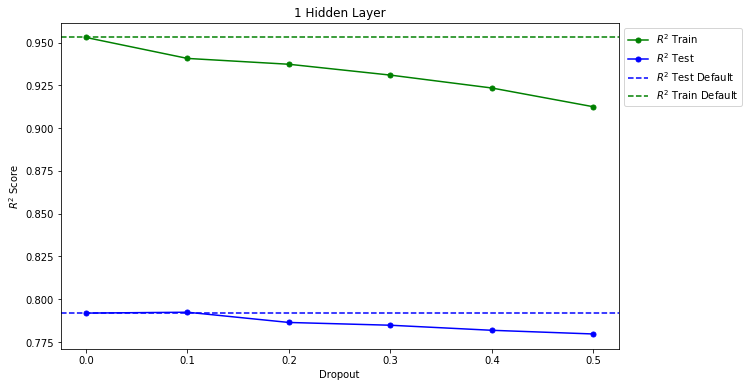

In [218]:
plt.figure(figsize=(10,6))
plt.plot(dropout_list, train_r2_1ldo, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(dropout_list, test_r2_1ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('1 Hidden Layer')
plt.xlabel('Dropout')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_1HL_Dropout_R2.png', bbox_inches='tight')

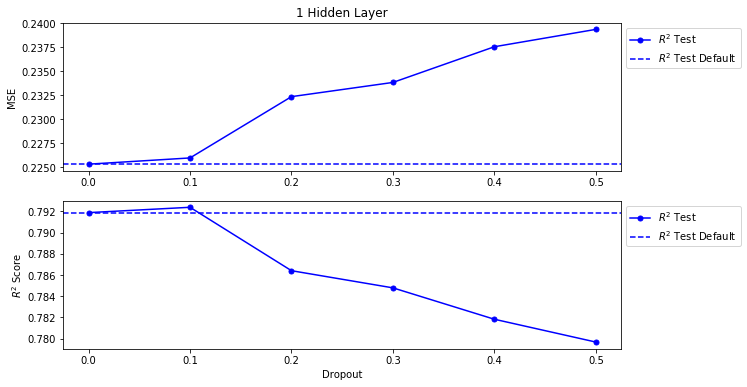

In [219]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(dropout_list, test_r2_1ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Dropout')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('1 Hidden Layer')
ax1.plot(dropout_list, mse_1ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_1HL_Dropout_MSE_R2.png', bbox_inches='tight')

In [102]:
test_r2_2ldo, mse_2ldo, train_r2_2ldo = list(), list(), list()
dropout_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5]

for dropout in dropout_list:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_2ldo.append(np.mean(train_r2_model))
    test_r2_2ldo.append(np.mean(test_r2_model))
    mse_2ldo.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_2ldo))
print('Optimal R2 Train: ', train_r2_2ldo[test_r2_2ldo.index(max(test_r2_2ldo))])
print('MSE: ', mse_2ldo[test_r2_2ldo.index(max(test_r2_2ldo))])
print('dropout: ', dropout_list[test_r2_2ldo.index(max(test_r2_2ldo))])

Default R2:  0.7918829288475372
Optimal R2 0.8132970374534316
Optimal R2 Train:  0.9520443743133399
MSE:  0.2026322928237257
dropout:  0.2


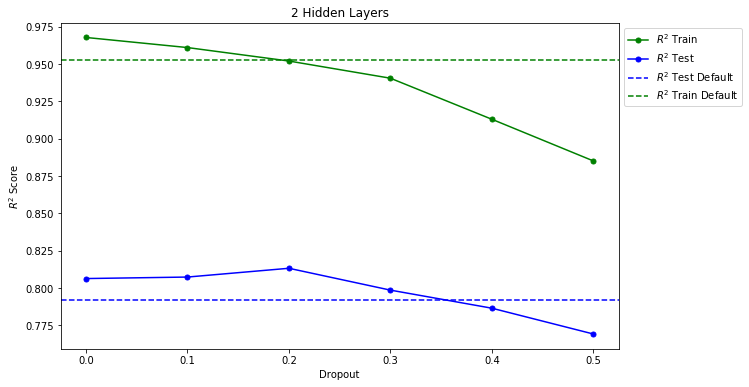

In [220]:
plt.figure(figsize=(10,6))
plt.plot(dropout_list, train_r2_2ldo, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(dropout_list, test_r2_2ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('2 Hidden Layers')
plt.xlabel('Dropout')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_2HL_Dropout_R2.png', bbox_inches='tight')

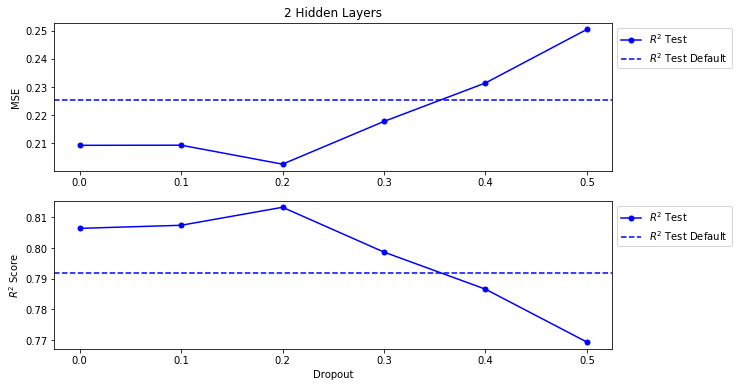

In [221]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(dropout_list, test_r2_2ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Dropout')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('2 Hidden Layers')
ax1.plot(dropout_list, mse_2ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_2HL_Dropout_MSE_R2.png', bbox_inches='tight')

In [105]:
test_r2_3ldo, mse_3ldo, train_r2_3ldo = list(), list(), list()
dropout_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5]

for dropout in dropout_list:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_3ldo.append(np.mean(train_r2_model))
    test_r2_3ldo.append(np.mean(test_r2_model))
    mse_3ldo.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_3ldo))
print('Optimal R2 Train: ', train_r2_3ldo[test_r2_3ldo.index(max(test_r2_3ldo))])
print('MSE: ', mse_3ldo[test_r2_3ldo.index(max(test_r2_3ldo))])
print('dropout: ', dropout_list[test_r2_3ldo.index(max(test_r2_3ldo))])

Default R2:  0.7918829288475372
Optimal R2 0.8092617799787882
Optimal R2 Train:  0.9587569029504615
MSE:  0.2074070330904151
dropout:  0.1


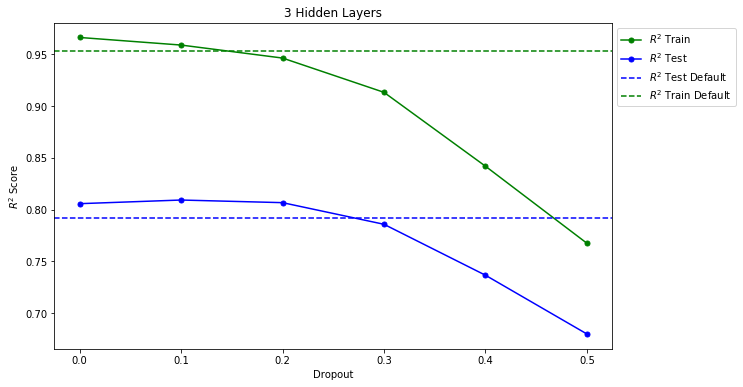

In [222]:
plt.figure(figsize=(10,6))
plt.plot(dropout_list, train_r2_3ldo, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(dropout_list, test_r2_3ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('3 Hidden Layers')
plt.xlabel('Dropout')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_3HL_Dropout_R2.png', bbox_inches='tight')

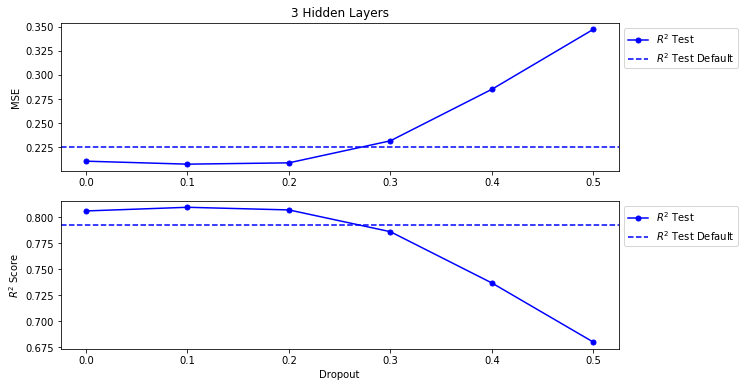

In [223]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(dropout_list, test_r2_3ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Dropout')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('3 Hidden Layers')
ax1.plot(dropout_list, mse_3ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_3HL_Dropout_MSE_R2.png', bbox_inches='tight')

In [108]:
test_r2_4ldo, mse_4ldo, train_r2_4ldo = list(), list(), list()
dropout_list = [0, 0.1, 0.2, 0.3, 0.4, 0.5]

for dropout in dropout_list:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))
        
        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))
        model.add(Dropout(dropout))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_4ldo.append(np.mean(train_r2_model))
    test_r2_4ldo.append(np.mean(test_r2_model))
    mse_4ldo.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_4ldo))
print('Optimal R2 Train: ', train_r2_4ldo[test_r2_4ldo.index(max(test_r2_4ldo))])
print('MSE: ', mse_4ldo[test_r2_4ldo.index(max(test_r2_4ldo))])
print('dropout: ', dropout_list[test_r2_4ldo.index(max(test_r2_4ldo))])

Default R2:  0.7918829288475372
Optimal R2 0.8075222259197699
Optimal R2 Train:  0.972261999820722
MSE:  0.20733366361972966
dropout:  0


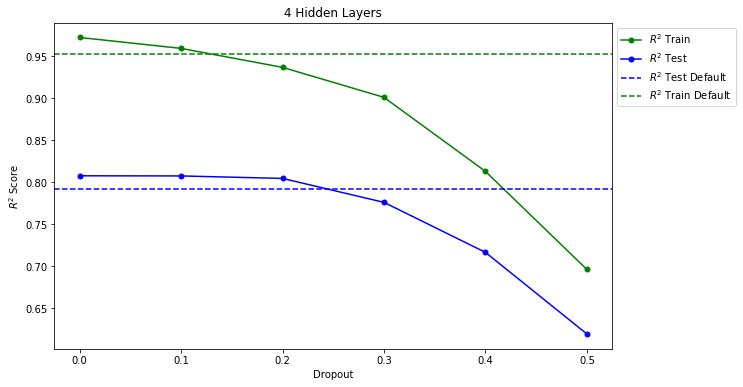

In [224]:
plt.figure(figsize=(10,6))
plt.plot(dropout_list, train_r2_4ldo, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(dropout_list, test_r2_4ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.title('4 Hidden Layers')
plt.xlabel('Dropout')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_4HL_Dropout_R2.png', bbox_inches='tight')

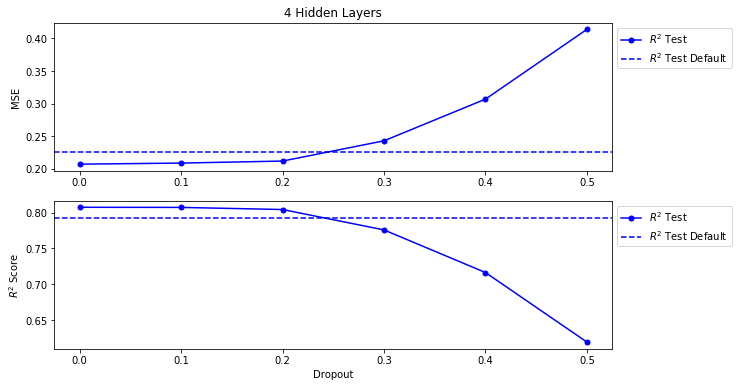

In [225]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(dropout_list, test_r2_4ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Dropout')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.set_title('4 Hidden Layers')
ax1.plot(dropout_list, mse_4ldo, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_4HL_Dropout_MSE_R2.png', bbox_inches='tight')

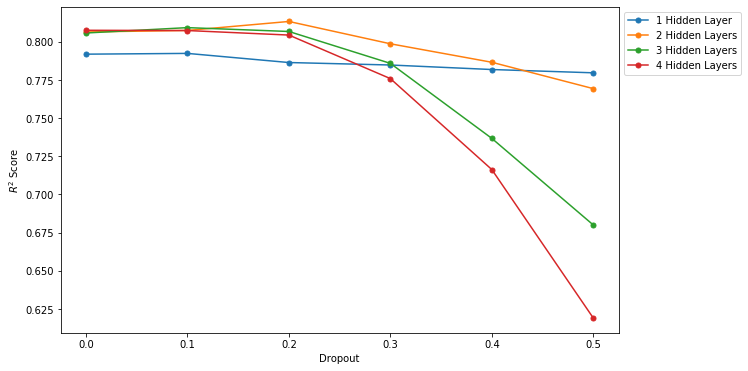

In [217]:
plt.figure(figsize=(10,6))
plt.plot(dropout_list, test_r2_1ldo, linestyle='-', marker='o', markersize=5,label='1 Hidden Layer')
plt.plot(dropout_list, test_r2_2ldo, linestyle='-', marker='o', markersize=5,label='2 Hidden Layers')
plt.plot(dropout_list, test_r2_3ldo, linestyle='-', marker='o', markersize=5,label='3 Hidden Layers')
plt.plot(dropout_list, test_r2_4ldo, linestyle='-', marker='o', markersize=5,label='4 Hidden Layers')
plt.xlabel('Dropout')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_HL_Dropout_MSE_R2.png', bbox_inches='tight')

# Epochs

In [84]:
test_r2_1le, mse_1le, train_r2_1le = list(), list(), list()
n_epochs = list(range(50, 550, 50))

for epochs in n_epochs:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=epochs)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_1le.append(np.mean(train_r2_model))
    test_r2_1le.append(np.mean(test_r2_model))
    mse_1le.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_1le))
print('Optimal R2 Train: ', train_r2_1le[test_r2_1le.index(max(test_r2_1le))])
print('MSE: ', mse_1le[test_r2_1le.index(max(test_r2_1le))])
print('epochs: ', n_epochs[test_r2_1le.index(max(test_r2_1le))])

Default R2:  0.7918829288475372
Optimal R2 0.7918829288475372
Optimal R2 Train:  0.9530088105409813
MSE:  0.2253131861354639
epochs:  100


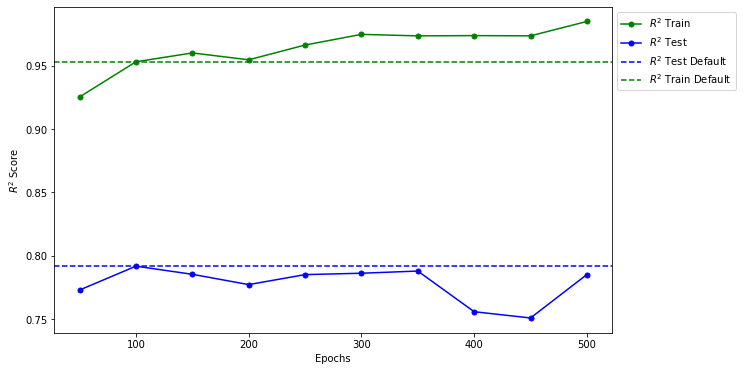

In [227]:
plt.figure(figsize=(10,6))
plt.plot(n_epochs, train_r2_1le, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_epochs, test_r2_1le, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.xlabel('Epochs')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Epochs_R2.png', bbox_inches='tight')

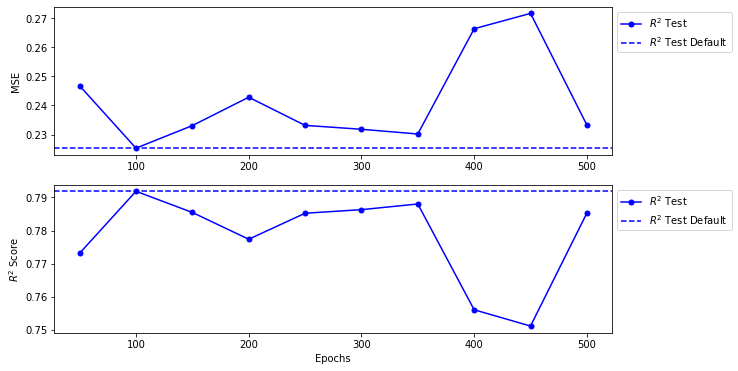

In [228]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_epochs, test_r2_1le, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.plot(n_epochs, mse_1le, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Epochs_MSE_R2.png', bbox_inches='tight')

# Batch_size

In [112]:
test_r2_1lbs, mse_1lbs, train_r2_1lbs = list(), list(), list()
n_batch = [32, 64, 128, 256, 512]

for batch_size in n_batch:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(optimizer='adam', loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=batch_size,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_1lbs.append(np.mean(train_r2_model))
    test_r2_1lbs.append(np.mean(test_r2_model))
    mse_1lbs.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_1lbs))
print('Optimal R2 Train: ', train_r2_1lbs[test_r2_1lbs.index(max(test_r2_1lbs))])
print('MSE: ', mse_1lbs[test_r2_1lbs.index(max(test_r2_1lbs))])
print('epochs: ', n_batch[test_r2_1lbs.index(max(test_r2_1lbs))])

Default R2:  0.7918829288475372
Optimal R2 0.79605067286343
Optimal R2 Train:  0.973951904056255
MSE:  0.2213530901013579
epochs:  64


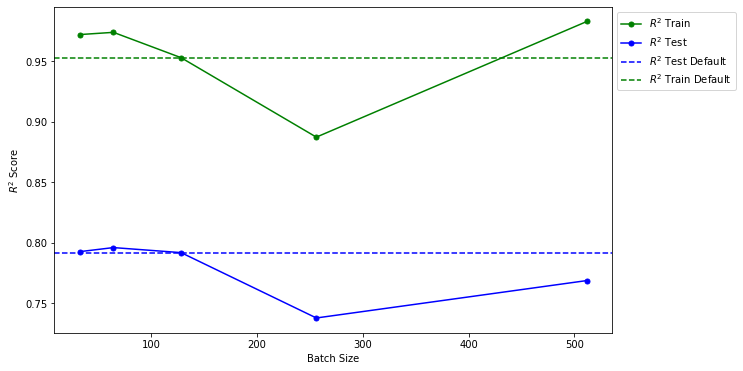

In [229]:
plt.figure(figsize=(10,6))
plt.plot(n_batch, train_r2_1lbs, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(n_batch, test_r2_1lbs, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.xlabel('Batch Size')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Batch_Size_R2.png', bbox_inches='tight')

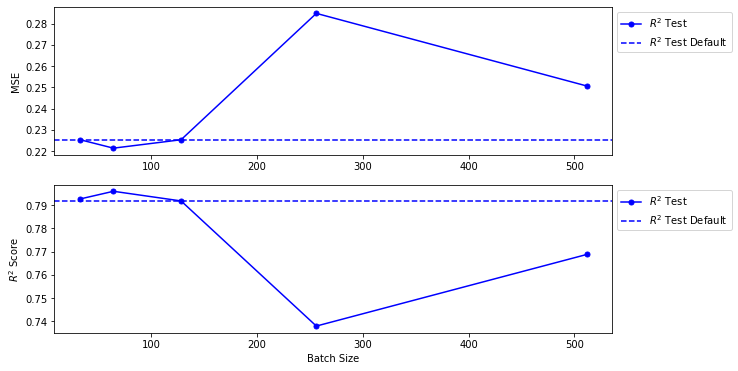

In [230]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(n_batch, test_r2_1lbs, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Batch Size')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.plot(n_batch, mse_1lbs, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Batch_Size_MSE_R2.png', bbox_inches='tight')

0.7918829288475372


# Learning Rate

In [15]:
test_r2_1llr, mse_1llr, train_r2_1llr = list(), list(), list()
lr_range = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 0.0006, 0.0007, 0.0008,
       0.0009, 0.001 , 0.0011, 0.0012, 0.0013, 0.0014, 0.0015, 0.0016,
       0.0017, 0.0018, 0.0019, 0.002 , 0.0021, 0.0022, 0.0023, 0.0024,
       0.0025, 0.0026, 0.0027, 0.0028, 0.0029, 0.003]

for learning_rate in lr_range:
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)
    
    train_r2_model, test_r2_model, mse_model = list(), list(), list()
    
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        model = Sequential()

        model.add(Dense(units=512, activation='relu', input_shape=[input_shape]))

        model.add(Dense(units=1))

        model.compile(Adam(learning_rate=learning_rate), loss='mae')
    
        model.fit(X_train, y_train,
             validation_data=(X_test, y_test),
             batch_size=128,
             verbose=0,
             epochs=100)
    
        train_r2_model.append(r2_score(y_train, model.predict(X_train)))
        test_r2_model.append(r2_score(y_test, model.predict(X_test)))
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))
    
    train_r2_1llr.append(np.mean(train_r2_model))
    test_r2_1llr.append(np.mean(test_r2_model))
    mse_1llr.append(np.mean(mse_model)) 

print('Default R2: ', r2_default)
print('Optimal R2', max(test_r2_1llr))
print('Optimal R2 Train: ', train_r2_1llr[test_r2_1llr.index(max(test_r2_1llr))])
print('MSE: ', mse_1llr[test_r2_1llr.index(max(test_r2_1llr))])
print('learning_rate: ', lr_range[test_r2_1llr.index(max(test_r2_1llr))])

Default R2:  0.7918829288475372
Optimal R2 0.7918829288475372
Optimal R2 Train:  0.9530088105409813
MSE:  0.2253131861354639
learning_rate:  0.001


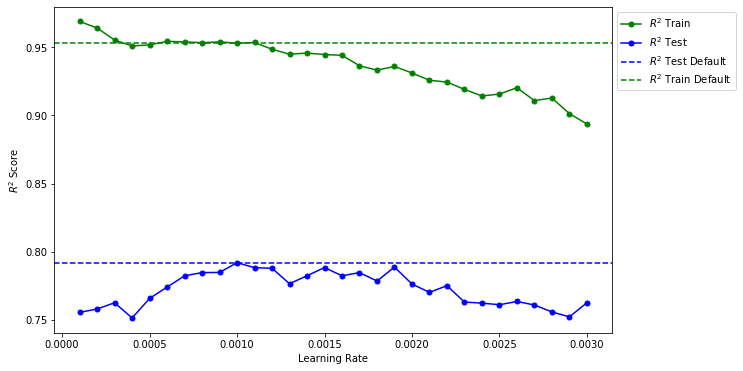

In [18]:
plt.figure(figsize=(10,6))
plt.plot(lr_range, train_r2_1llr, color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5,label='$R^2$ Train')
plt.plot(lr_range, test_r2_1llr, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.xlabel('Learning Rate')
plt.ylabel('$R^2$ Score')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Learning_Rate_R2.png', bbox_inches='tight')

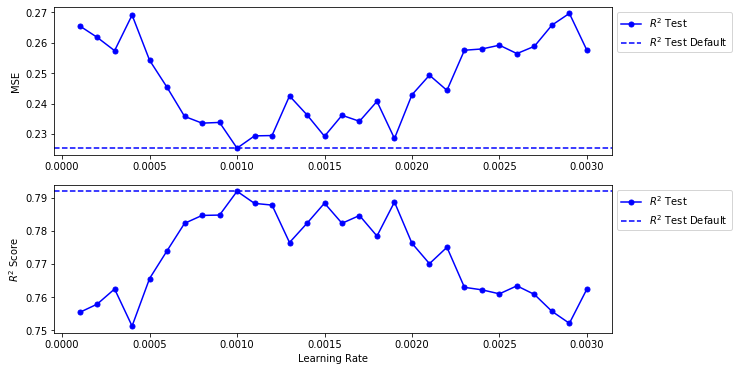

In [19]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(10,6))
ax2.plot(lr_range, test_r2_1llr, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax2.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax2.set_xlabel('Learning Rate')
ax2.set_ylabel('$R^2$ Score')
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left')
ax1.plot(lr_range, mse_1llr, color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
ax1.axhline(mse_default, linestyle='--', color='b', label='$R^2$ Test Default')
ax1.set_ylabel('MSE')
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Learning_Rate_MSE_R2.png', bbox_inches='tight')

Manual Parameters 

KFold R2 Test:  0.785001387677353
KFold R2 Train:  0.9629769917835629
KFold MAE:  0.32870463516941145
KFold MSE:  0.2336193971664457
KFold RMSE:  0.4833419050387062


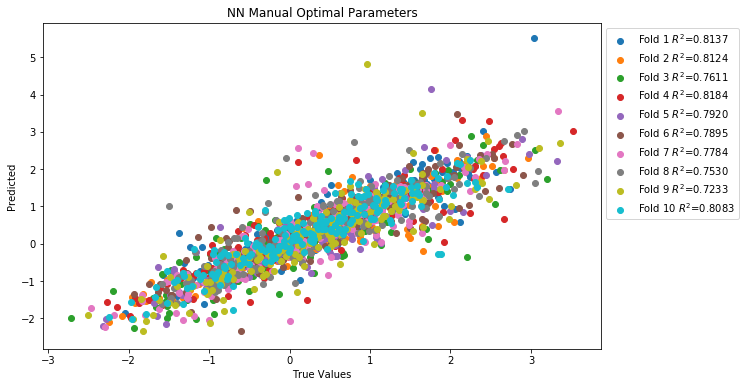

In [145]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_mopt, mae_mopt, mse_mopt, train_r2_mopt = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('NN Manual Optimal Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=400, activation='relu', input_shape=[input_shape]))
    model.add(Dropout(0.1))

    model.add(Dense(units=1))

    model.compile(optimizer='adam', loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=64,
         verbose=0,
         epochs=100)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_mopt.append(r2_score(y_test, model.predict(X_test)))
    mae_mopt.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_mopt.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_mopt.append(r2_score(y_train, model.predict(X_train)))
    
r2_manual = np.mean(r2_mopt)
mae_manual = np.mean(mae_mopt)
mse_manual = np.mean(mse_mopt)
rmse_manual = np.sqrt(mse_manual)
train_r2_manual = np.mean(train_r2_mopt)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Manual_Parameters.png', bbox_inches='tight')

print('Manual Parameters', '\n')
print('KFold R2 Test: ', r2_manual)
print('KFold R2 Train: ', train_r2_manual)
print('KFold MAE: ', mae_manual)
print('KFold MSE: ', mse_manual)
print('KFold RMSE: ', rmse_manual)

In [20]:
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import RandomizedSearchCV

In [111]:
def create_model(neurons=1, dropout_rate=0.0, learn_rate=0.001):
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_dim=447))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=learn_rate)
    model.compile(optimizer=optimizer, loss='mae')
    
    return model

seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

keras_reg = KerasRegressor(build_fn=create_model, verbose=0)

neurons = list(range(50, 1050, 50))
dropout_rate = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
learn_rate = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 
              0.0006, 0.0007, 0.0008, 0.0009, 
              0.001]
epochs = list(range(50, 550, 50))
batch_size = [32, 64, 128, 256, 512]

param_grid = dict(neurons=neurons, dropout_rate=dropout_rate, 
                  learn_rate=learn_rate, epochs=epochs, batch_size=batch_size)

cv = KFold(n_splits=10, shuffle=True, random_state=101)
random_grid = RandomizedSearchCV(estimator=keras_reg, 
                                 param_distributions=param_grid, 
                                 cv=cv, 
                                 n_iter=50,
                                 scoring='r2',  
                                 verbose=3,
                                 return_train_score=True,
                                 random_state=42)

In [112]:
random_grid.fit(X, y)

Fitting 10 folds for each of 50 candidates, totalling 500 fits
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.912, test=0.758), total=   2.3s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.4s remaining:    0.0s


[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.915, test=0.732), total=   2.2s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    4.6s remaining:    0.0s


[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.919, test=0.667), total=   2.2s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 
[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.914, test=0.798), total=   2.2s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 
[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.919, test=0.762), total=   2.2s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 
[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.919, test=0.747), total=   2.2s
[CV] neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512 
[CV]  neurons=150, learn_rate=0.0002, epochs=150, dropout_rate=0.4, batch_size=512, score=(train=0.918, test=0.778), total=   2.2s
[CV] neurons=

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 152.7min finished


RandomizedSearchCV(cv=KFold(n_splits=10, random_state=101, shuffle=True),
                   error_score=nan,
                   estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb4ed8e1e50>,
                   iid='deprecated', n_iter=50, n_jobs=None,
                   param_distributions={'batch_size': [32, 64, 128, 256, 512],
                                        'dropout_rate': [0, 0.1, 0.2, 0.3, 0.4,
                                                         0.5],
                                        'epochs': [50, 100, 150, 200, 250, 300,
                                                   350, 400, 450, 500],
                                        'learn_rate': [0.0001, 0.0002, 0.0003,
                                                       0.0004, 0.0005, 0.0006,
                                                       0.0007, 0.0008, 0.0009,
                                                       0.001],
                                     

In [113]:
# 1 Hidden Layer Random Best Params
# neurons=200, learn_rate=0.0004, epochs=150, dropout_rate=0.4, batch_size=32
random_grid.best_params_

{'neurons': 550,
 'learn_rate': 0.0003,
 'epochs': 250,
 'dropout_rate': 0.2,
 'batch_size': 64}

GridSearch Parameters 

KFold Test R2:  0.8001558828035711
KFold Train R2:  0.9808728804083696
KFold MAE:  0.3203952107566713
KFold MSE:  0.21725064569060662
KFold RMSE:  0.46610154010752486


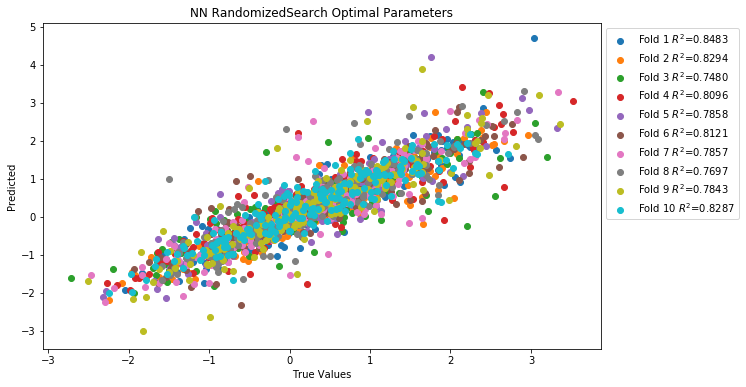

In [114]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_gsopt, mae_gsopt, mse_gsopt, train_r2_gsopt = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('NN RandomizedSearch Optimal Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=550, activation='relu', input_shape=[input_shape]))
    model.add(Dropout(0.2))
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=0.0003)
    model.compile(optimizer=optimizer, loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=64,
         verbose=0,
         epochs=250)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_gsopt.append(r2_score(y_test, model.predict(X_test)))
    mae_gsopt.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_gsopt.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_gsopt.append(r2_score(y_train, model.predict(X_train)))
    
r2_grid = np.mean(r2_gsopt)
mae_grid = np.mean(mae_gsopt)
mse_grid = np.mean(mse_gsopt)
rmse_grid = np.sqrt(mse_grid)
train_r2_grid = np.mean(train_r2_gsopt)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Random_Parameters.png', bbox_inches='tight')

print('GridSearch Parameters', '\n')
print('KFold Test R2: ', r2_grid)
print('KFold Train R2: ', train_r2_grid)
print('KFold MAE: ', mae_grid)
print('KFold MSE: ', mse_grid)
print('KFold RMSE: ', rmse_grid)

In [129]:
nn_gs_cv = pd.DataFrame(random_grid.cv_results_)

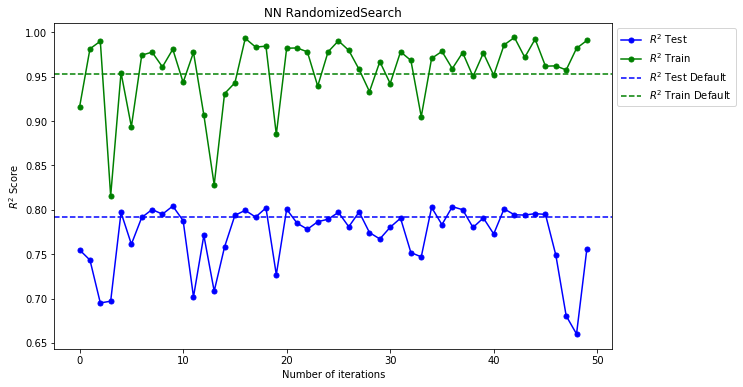

In [130]:
plt.figure(figsize=(10,6))
plt.plot(nn_gs_cv['mean_test_score'], color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.plot(nn_gs_cv['mean_train_score'], color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5, label='$R^2$ Train')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.ylabel('$R^2$ Score')
plt.xlabel('Number of iterations')
plt.title('NN RandomizedSearch')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_RandomizedSearchCV.png', bbox_inches='tight')

In [132]:
def create_model(neurons=1, neurons_l2=1, dropout_rate=0.0, dropout_rate_l2=0.0, learn_rate=0.001):
    model = Sequential()
    model.add(Dense(neurons, activation='relu', input_dim=447))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neurons_l2, activation='relu'))
    model.add(Dropout(dropout_rate_l2))
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=learn_rate)
    model.compile(optimizer=optimizer, loss='mae')
    
    return model

seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

keras_reg = KerasRegressor(build_fn=create_model, verbose=0)

neurons = list(range(50, 1050, 50))
neurons_l2 = list(range(50, 1050, 50))
dropout_rate = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
dropout_rate_l2 = [0, 0.1, 0.2, 0.3, 0.4, 0.5]
learn_rate = [0.0001, 0.0002, 0.0003, 0.0004, 0.0005, 
              0.0006, 0.0007, 0.0008, 0.0009, 
              0.001]
epochs = list(range(50, 550, 50))
batch_size = [32, 64, 128, 256, 512]

param_grid = dict(neurons=neurons, neurons_l2=neurons_l2, dropout_rate=dropout_rate, dropout_rate_l2=dropout_rate_l2, 
                  learn_rate=learn_rate, epochs=epochs, batch_size=batch_size)

cv = KFold(n_splits=10, shuffle=True, random_state=101)
random_grid_layer = RandomizedSearchCV(estimator=keras_reg, 
                                 param_distributions=param_grid, 
                                 cv=cv, 
                                 n_iter=50,
                                 scoring='r2',  
                                 verbose=3,
                                 return_train_score=True,
                                 random_state=42)

In [133]:
random_grid_layer.fit(X, y)

Fitting 10 folds for each of 50 candidates, totalling 500 fits
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.967, test=0.828), total=  22.7s
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   22.8s remaining:    0.0s


[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.973, test=0.805), total=  24.4s
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   47.3s remaining:    0.0s


[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.972, test=0.736), total=  23.2s
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 
[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.966, test=0.807), total=  22.5s
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 
[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.966, test=0.785), total=  22.4s
[CV] neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512 
[CV]  neurons_l2=750, neurons=550, learn_rate=0.0004, epochs=200, dropout_rate_l2=0.4, dropout_rate=0.2, batch_size=512, score=(train=0.

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 302.7min finished


RandomizedSearchCV(cv=KFold(n_splits=10, random_state=101, shuffle=True),
                   error_score=nan,
                   estimator=<tensorflow.python.keras.wrappers.scikit_learn.KerasRegressor object at 0x7fb4bc83bd50>,
                   iid='deprecated', n_iter=50, n_jobs=None,
                   param_distributions={'batch_size': [32, 64, 128, 256, 512],
                                        'dropout_rate': [0, 0.1, 0.2, 0.3, 0.4,
                                                         0.5],
                                        'dropout_rate_l2': [0, 0.1, 0.2, 0.3,
                                                            0.4...
                                        'learn_rate': [0.0001, 0.0002, 0.0003,
                                                       0.0004, 0.0005, 0.0006,
                                                       0.0007, 0.0008, 0.0009,
                                                       0.001],
                                        'neu

In [134]:
random_grid_layer.best_params_

{'neurons_l2': 50,
 'neurons': 650,
 'learn_rate': 0.0003,
 'epochs': 500,
 'dropout_rate_l2': 0.4,
 'dropout_rate': 0.3,
 'batch_size': 32}

GridSearch Parameters 

KFold Test R2:  0.8218714276455733
KFold Train R2:  0.9871475887673556
KFold MAE:  0.30565194089400094
KFold MSE:  0.1931705696206084
KFold RMSE:  0.43951174002591603


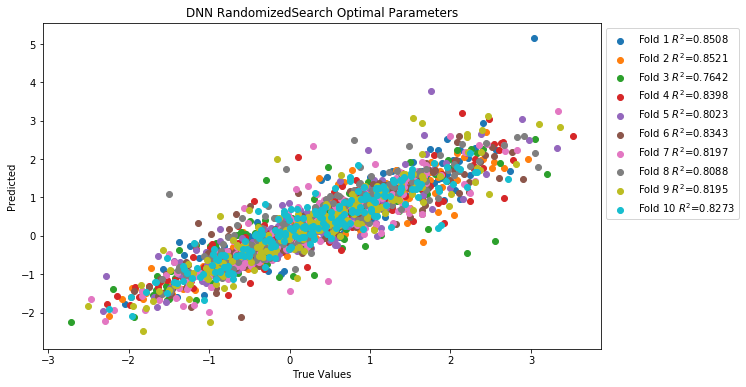

In [135]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_gsopt_deep, mae_gsopt_deep, mse_gsopt_deep, train_r2_gsopt_deep = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('DNN RandomizedSearch Optimal Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=650, activation='relu', input_shape=[input_shape]))
    model.add(Dropout(0.3))
    model.add(Dense(units=50, activation='relu'))
    model.add(Dropout(0.4))
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=0.0003)
    model.compile(optimizer=optimizer, loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=32,
         verbose=0,
         epochs=500)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_gsopt_deep.append(r2_score(y_test, model.predict(X_test)))
    mae_gsopt_deep.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_gsopt_deep.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_gsopt_deep.append(r2_score(y_train, model.predict(X_train)))
    
r2_grid_deep = np.mean(r2_gsopt_deep)
mae_grid_deep = np.mean(mae_gsopt_deep)
mse_grid_deep = np.mean(mse_gsopt_deep)
rmse_grid_deep = np.sqrt(mse_grid_deep)
train_r2_grid_deep = np.mean(train_r2_gsopt_deep)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/DNN_Random_Parameters.png', bbox_inches='tight')

print('GridSearch Parameters', '\n')
print('KFold Test R2: ', r2_grid_deep)
print('KFold Train R2: ', train_r2_grid_deep)
print('KFold MAE: ', mae_grid_deep)
print('KFold MSE: ', mse_grid_deep)
print('KFold RMSE: ', rmse_grid_deep)

In [136]:
dnn_gs_cv = pd.DataFrame(random_grid_layer.cv_results_)

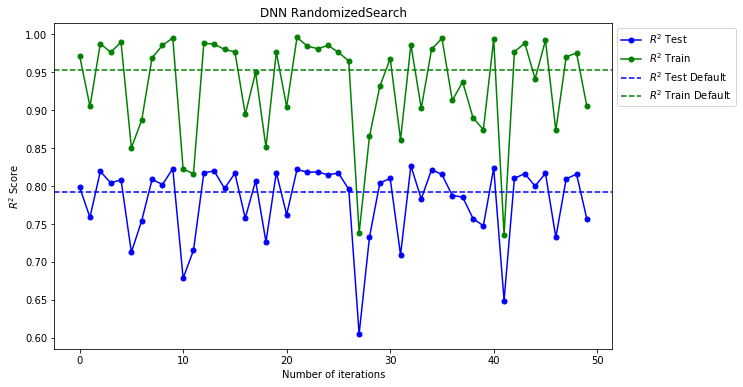

In [137]:
plt.figure(figsize=(10,6))
plt.plot(dnn_gs_cv['mean_test_score'], color='b', linestyle='-', marker='o', markerfacecolor='b', markersize=5, label='$R^2$ Test')
plt.plot(dnn_gs_cv['mean_train_score'], color='g', linestyle='-', marker='o', markerfacecolor='g', markersize=5, label='$R^2$ Train')
plt.axhline(r2_default, linestyle='--', color='b', label='$R^2$ Test Default')
plt.axhline(train_r2_default, linestyle='--', color='g', label='$R^2$ Train Default')
plt.ylabel('$R^2$ Score')
plt.xlabel('Number of iterations')
plt.title('DNN RandomizedSearch')
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/DNN_RandomizedSearchCV.png', bbox_inches='tight')

In [31]:
import optuna

In [32]:
tf.keras.backend.set_floatx('float64')

In [138]:
def objective(trial):

    mse_model = list()
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model = tf.keras.Sequential()
        n_neurons = trial.suggest_int('n_neurons', 50, 1000)
        model.add(Dense(n_neurons, activation='relu'))
        dropout_rate = trial.suggest_float('dropout_rate', 0.0, 0.5)
        model.add(Dropout(dropout_rate))
        model.add(Dense(units=1))
        
        learn_rate = trial.suggest_loguniform('learn_rate', 0.0001, 0.001)
        optimizer=Adam(learning_rate=learn_rate)
        model.compile(optimizer=optimizer, loss='mae')
        
        n_epochs = trial.suggest_int('n_epochs', 50, 500)
        batch_size = trial.suggest_int('batch_size', 10, 500)
        model.fit(X_train, y_train, 
                  validation_data=(X_test, y_test), 
                  batch_size=batch_size, 
                  verbose=0, 
                  epochs=n_epochs)
        
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))

    return np.mean(mse_model)

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

[I 2021-07-13 23:39:53,621] A new study created in memory with name: no-name-37a094f5-e7b1-4005-8968-c0ef6bbc027e
[I 2021-07-13 23:42:33,035] Trial 0 finished with value: 0.2329330645198351 and parameters: {'n_neurons': 289, 'dropout_rate': 0.1785585861688604, 'learn_rate': 0.000301442286654295, 'n_epochs': 425, 'batch_size': 364}. Best is trial 0 with value: 0.2329330645198351.
[I 2021-07-13 23:48:30,370] Trial 1 finished with value: 0.21248623718288223 and parameters: {'n_neurons': 988, 'dropout_rate': 0.21799713070324966, 'learn_rate': 0.0006693561994955213, 'n_epochs': 315, 'batch_size': 77}. Best is trial 1 with value: 0.21248623718288223.
[I 2021-07-13 23:50:36,638] Trial 2 finished with value: 0.21927450602129145 and parameters: {'n_neurons': 534, 'dropout_rate': 0.20633761274325957, 'learn_rate': 0.00016300804167414964, 'n_epochs': 235, 'batch_size': 261}. Best is trial 1 with value: 0.21248623718288223.
[I 2021-07-13 23:53:58,220] Trial 3 finished with value: 0.216671056476170

'n_neurons': 601, 'dropout_rate': 0.44413228435096325, 'learn_rate': 0.000376247921580489, 'n_epochs': 236, 'batch_size': 197'

Optuna Parameters 

KFold R2:  0.8086494159531817
KFold R2 Train:  0.9676102288104413
KFold MAE:  0.31366980602789213
KFold MSE:  0.2081362869068278
KFold RMSE:  0.4562195599783374


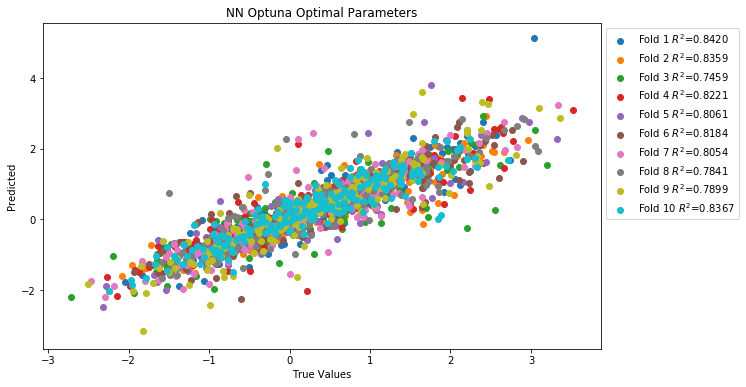

In [139]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_opt, mae_opt, mse_opt, train_r2_opt = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('NN Optuna Optimal Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=601, activation='relu', input_shape=[input_shape]))
    model.add(Dropout(0.44413228435096325))
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=0.000376247921580489)
    model.compile(optimizer=optimizer, loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=197,
         verbose=0,
         epochs=236)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_opt.append(r2_score(y_test, model.predict(X_test)))
    mae_opt.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_opt.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_opt.append(r2_score(y_train, model.predict(X_train)))
    
r2_optuna = np.mean(r2_opt)
mae_optuna = np.mean(mae_opt)
mse_optuna = np.mean(mse_opt)
rmse_optuna = np.sqrt(mse_optuna)
train_r2_optuna = np.mean(train_r2_opt)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/NN_Optuna.png', bbox_inches='tight')

print('Optuna Parameters', '\n')
print('KFold R2: ', r2_optuna)
print('KFold R2 Train: ', train_r2_optuna)
print('KFold MAE: ', mae_optuna)
print('KFold MSE: ', mse_optuna)
print('KFold RMSE: ', rmse_optuna)

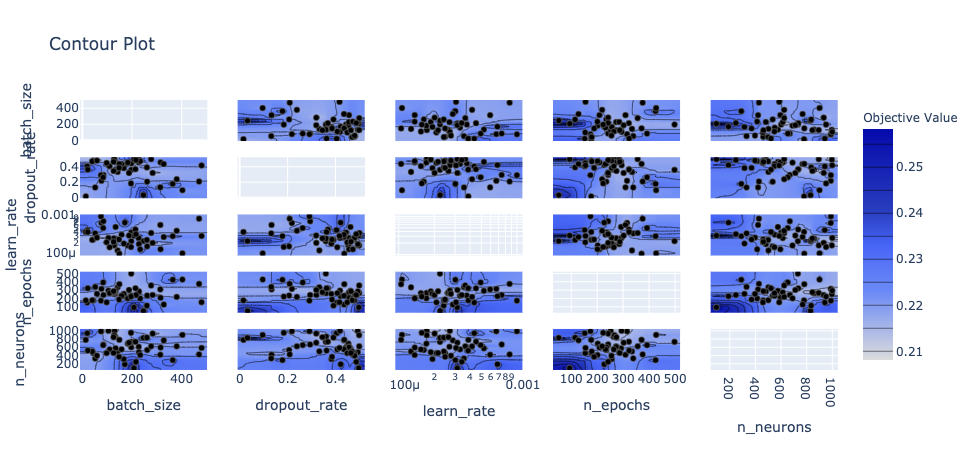

In [140]:
optuna.visualization.plot_contour(study)

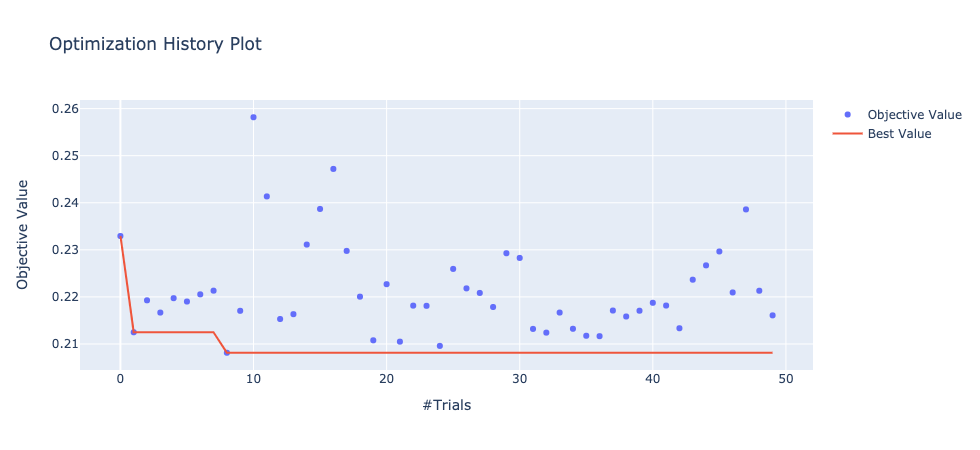

In [141]:
optuna.visualization.plot_optimization_history(study)

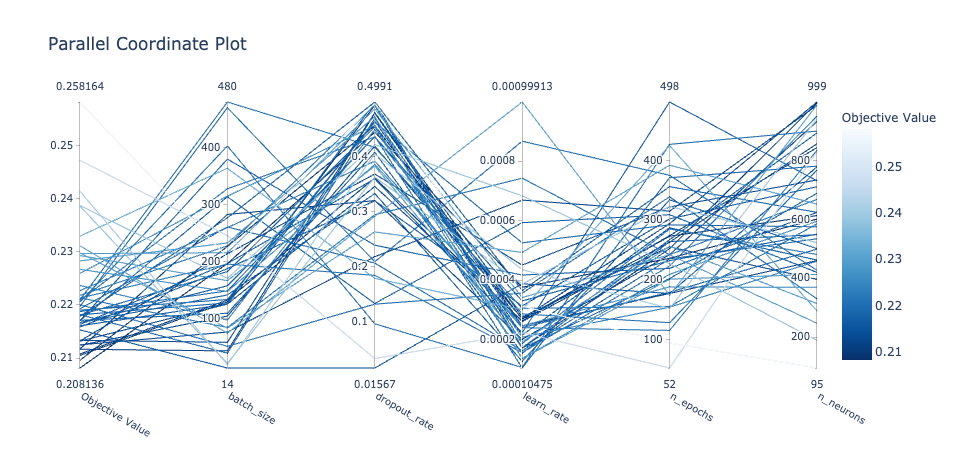

In [142]:
optuna.visualization.plot_parallel_coordinate(study)

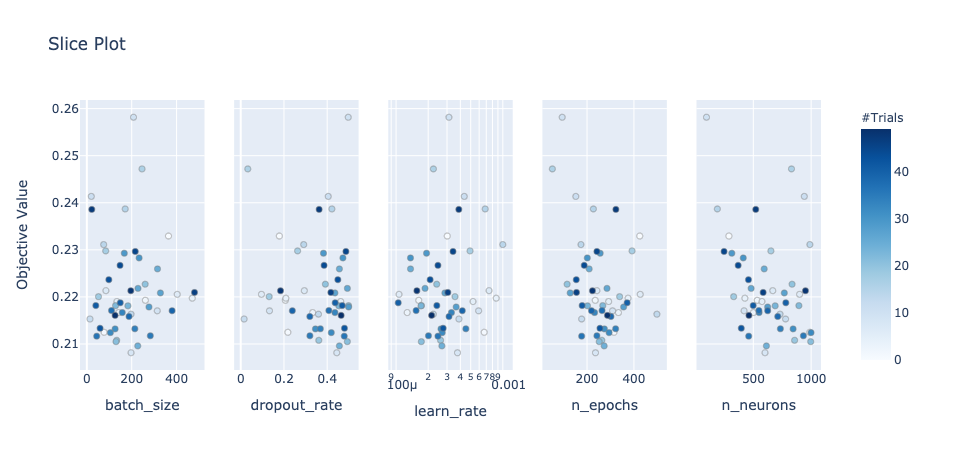

In [143]:
optuna.visualization.plot_slice(study)

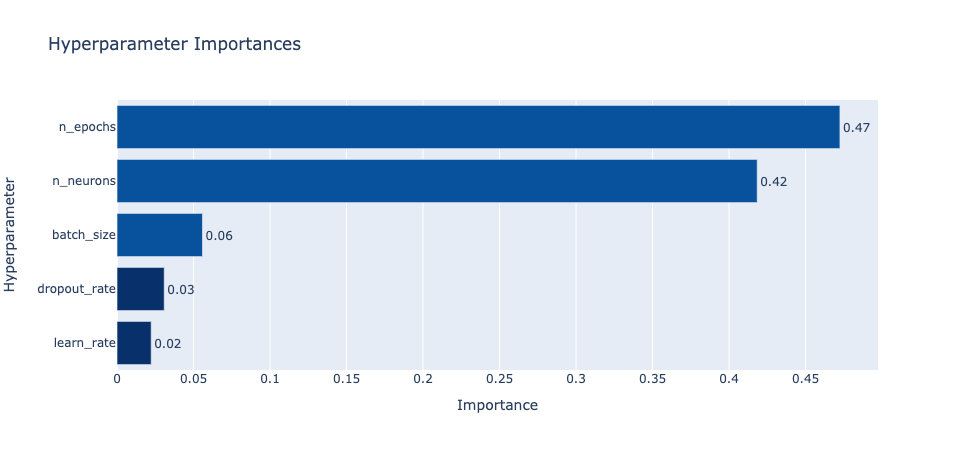

In [144]:
optuna.visualization.plot_param_importances(study)

In [33]:
def objective(trial):

    mse_model = list()
    
    seed = 42
    np.random.seed(seed)
    rn.seed(seed)
    tf.random.set_seed(seed)

    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model = tf.keras.Sequential()

        num_hidden_l1 = trial.suggest_int('num_hidden_l1', 50, 1000)
        model.add(Dense(num_hidden_l1, activation='relu'))
        dropout_rate_l1 = trial.suggest_float('dropout_rate_l1', 0.0, 0.5)
        model.add(Dropout(dropout_rate_l1))
            
        num_hidden_l2 = trial.suggest_int('num_hidden_l2', 50, 1000)
        model.add(Dense(num_hidden_l2, activation='relu'))
        dropout_rate_l2 = trial.suggest_float('dropout_rate_l2', 0.0, 0.5)
        model.add(Dropout(dropout_rate_l2))
        
        model.add(Dense(units=1))
        
        learn_rate = trial.suggest_loguniform('learn_rate', 0.0001, 0.001)
        optimizer=Adam(learning_rate=learn_rate)
        model.compile(optimizer=optimizer, loss='mae')
        
        n_epochs = trial.suggest_int('n_epochs', 50, 500)
        batch_s = trial.suggest_int('batch_s', 10, 500)
        model.fit(X_train, y_train, 
                  validation_data=(X_test, y_test), 
                  batch_size=batch_s, 
                  verbose=0, 
                  epochs=n_epochs)
        
        mse_model.append(mean_squared_error(y_test, model.predict(X_test)))

    return np.mean(mse_model)

study_layers = optuna.create_study(direction='minimize')
study_layers.optimize(objective, n_trials=50)

[I 2021-07-12 21:44:07,468] A new study created in memory with name: no-name-44b98724-1ce0-404b-8124-6699786a8844
[I 2021-07-12 21:47:57,778] Trial 0 finished with value: 0.26009648733975677 and parameters: {'num_hidden_l1': 87, 'dropout_rate_l1': 0.2707479311054307, 'num_hidden_l2': 896, 'dropout_rate_l2': 0.28735890033147776, 'learn_rate': 0.0006551269954432165, 'n_epochs': 253, 'batch_s': 45}. Best is trial 0 with value: 0.26009648733975677.
[I 2021-07-12 21:51:15,155] Trial 1 finished with value: 0.20099325663897033 and parameters: {'num_hidden_l1': 783, 'dropout_rate_l1': 0.21130960160895007, 'num_hidden_l2': 737, 'dropout_rate_l2': 0.3628480363700944, 'learn_rate': 0.0007115920183528365, 'n_epochs': 115, 'batch_s': 237}. Best is trial 1 with value: 0.20099325663897033.
[I 2021-07-12 21:52:26,620] Trial 2 finished with value: 0.22093644539413138 and parameters: {'num_hidden_l1': 137, 'dropout_rate_l1': 0.06056100378515944, 'num_hidden_l2': 503, 'dropout_rate_l2': 0.013076110547649

'n_layers': 2, 'num_hidden_l1': 826, 'dropout_rate_l1': 0.33491475497618006, 'num_hidden_l2': 475, 'dropout_rate_l2': 0.4908080198714235, 'learn_rate': 0.0005945945677009337, 'n_epochs': 207, 'batch_s': 186

'num_hidden_l1': 944, 'dropout_rate_l1': 0.16131170137376136, 'num_hidden_l2': 784, 'dropout_rate_l2': 0.49360024637510574, 'learn_rate': 0.0003210649844799545, 'n_epochs': 498, 'batch_s': 75

Optuna Parameters 

KFold R2:  0.8286088873050346
KFold R2 Train:  0.9921284603133318
KFold MAE:  0.3014548109064714
KFold MSE:  0.18604851635073377
KFold RMSE:  0.4313334166868291


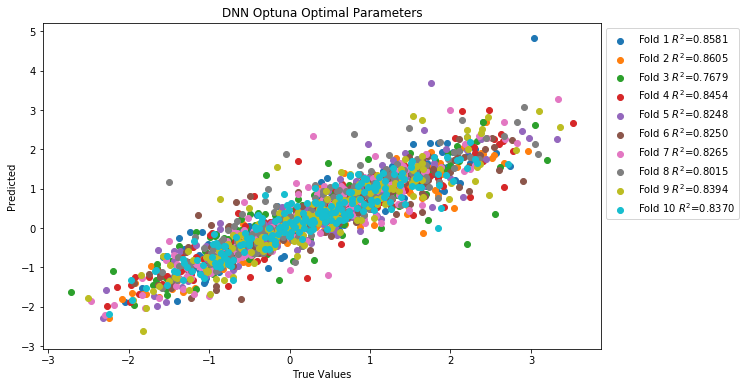

In [34]:
seed = 42
np.random.seed(seed)
rn.seed(seed)
tf.random.set_seed(seed)

r2_opt2, mae_opt2, mse_opt2, train_r2_opt2 = list(), list(), list(), list()

plt.figure(figsize=(10,6))
plt.title('DNN Optuna Optimal Parameters')
plt.ylabel('Predicted')
plt.xlabel('True Values')

for i, (train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    model = Sequential()

    model.add(Dense(units=944, activation='relu', input_shape=[input_shape]))
    model.add(Dropout(0.16131170137376136))
    
    model.add(Dense(units=784, activation='relu'))
    model.add(Dropout(0.49360024637510574))
    
    model.add(Dense(units=1))
    
    optimizer=Adam(learning_rate=0.0003210649844799545)
    model.compile(optimizer=optimizer, loss='mae')
    
    model.fit(X_train, y_train,
         validation_data=(X_test, y_test),
         batch_size=75,
         verbose=0,
         epochs=498)
    
    lab = 'Fold %d $R^2$=%.4f' % (i+1, r2_score(y_test, model.predict(X_test)))
    plt.scatter(y_test, model.predict(X_test), label=lab)
    
    r2_opt2.append(r2_score(y_test, model.predict(X_test)))
    mae_opt2.append(mean_absolute_error(y_test, model.predict(X_test)))
    mse_opt2.append(mean_squared_error(y_test, model.predict(X_test)))
    train_r2_opt2.append(r2_score(y_train, model.predict(X_train)))
    
r2_optuna_nn = np.mean(r2_opt2)
mae_optuna_nn = np.mean(mae_opt2)
mse_optuna_nn = np.mean(mse_opt2)
rmse_optuna_nn = np.sqrt(mse_optuna_nn)
train_r2_optuna_nn = np.mean(train_r2_opt2)

plt.legend(bbox_to_anchor=(1, 1), loc='upper left')
plt.savefig('Graphs/DNN_Optuna.png', bbox_inches='tight')

print('Optuna Parameters', '\n')
print('KFold R2: ', r2_optuna_nn)
print('KFold R2 Train: ', train_r2_optuna_nn)
print('KFold MAE: ', mae_optuna_nn)
print('KFold MSE: ', mse_optuna_nn)
print('KFold RMSE: ', rmse_optuna_nn)

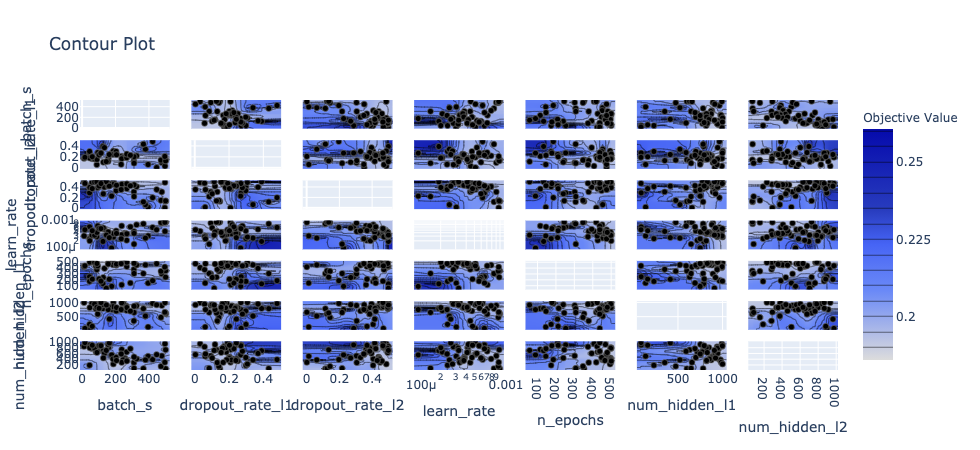

In [35]:
optuna.visualization.plot_contour(study_layers)

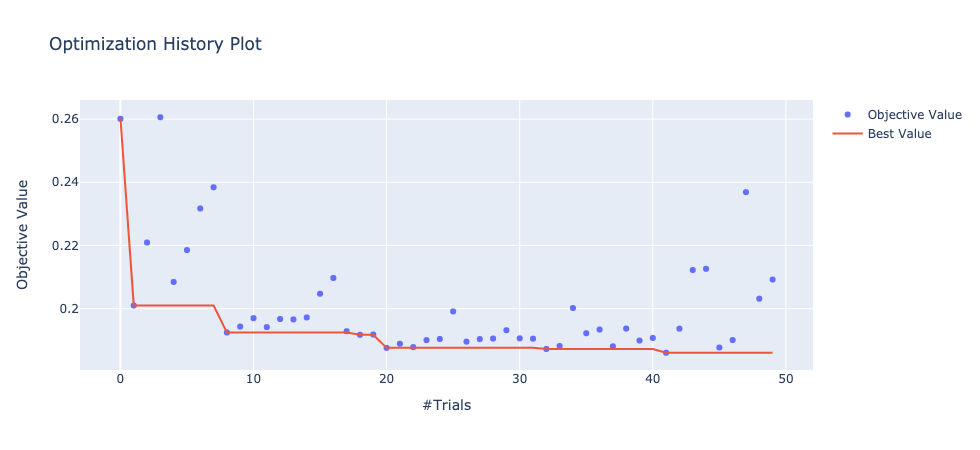

In [37]:
optuna.visualization.plot_optimization_history(study_layers)

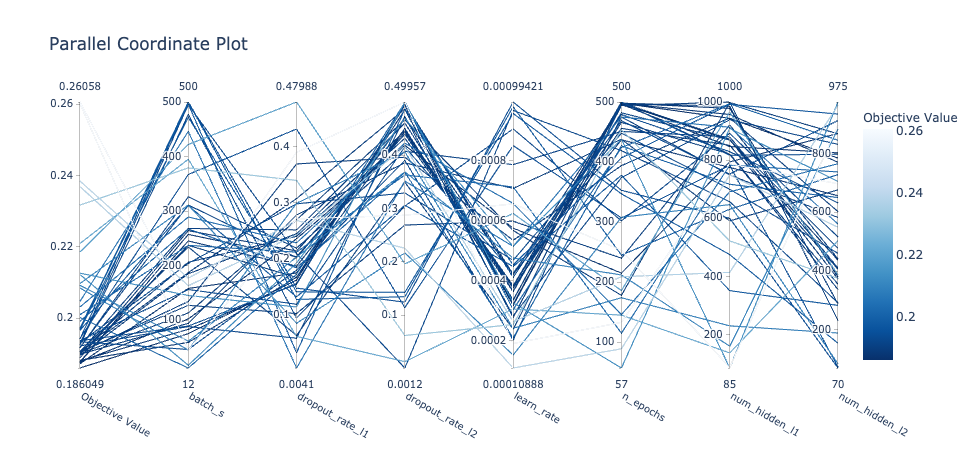

In [38]:
optuna.visualization.plot_parallel_coordinate(study_layers)

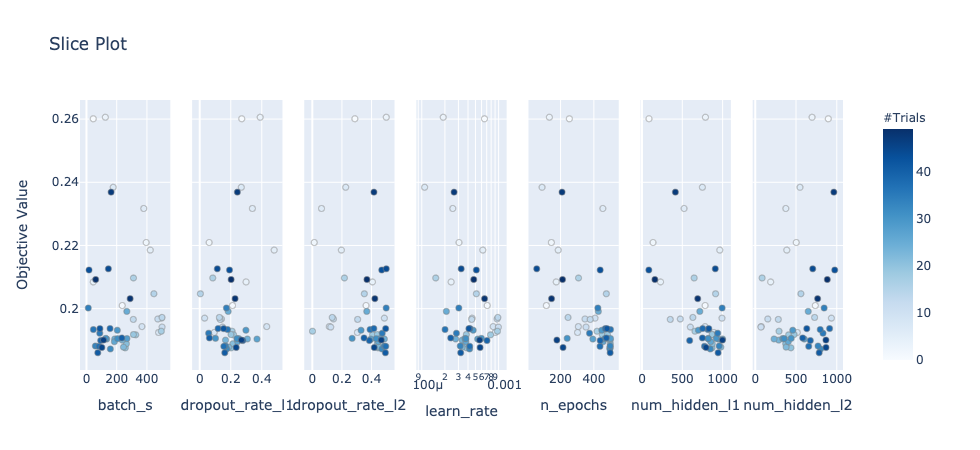

In [39]:
optuna.visualization.plot_slice(study_layers)

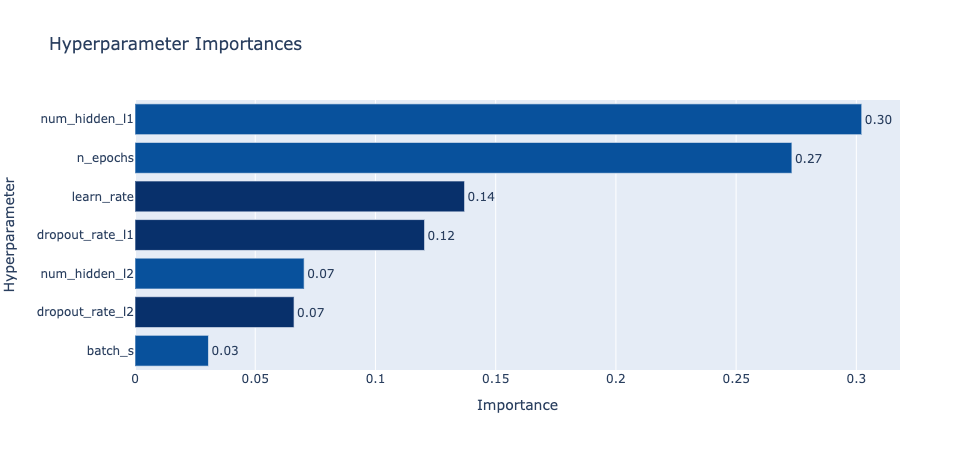

In [40]:
optuna.visualization.plot_param_importances(study_layers)